# Fatster R-CNN model for PCB Defects Detection

- 1.Introduction

    - Generate CSV


- 2.Split Dataset to Train and Test and Validation

    - Visualization

- 3.Creating Custom Database

- 4.Dataloader

- 3.Training

- 4.Testing

- 5.Evaluation

- 6.Prediction

# 0.Introduction

#### __Dataset Source__
Source：The Open Lab on Human Robot Interaction of Peking University has released the PCB defect dataset.

Categories：6 types of defects are made by photoshop, a graphics editor published by Adobe Systems. The defects defined in the dataset are: missing hole, mouse bite, open circuit, short, spur, and spurious copper.

Size: 693 images and 2953 labels

#### __Require__
python： 3.9.16

pytorch：2.0.1

dataset

util

#### __Reference__
This jupyternotbook is based on this reference: https://www.kaggle.com/code/waseemnagahhenes/pcb-defect-detection


####__Question__       

6.how to use mAP???
            
9.do I need to do some image augmentation????
          

####__Solved__


0.automatic stop epoch?

    ealry stopping
2.how to use NMS?

    not in the train, in the test

3.what should we look at in each epoch?

    lr,loss, AP

4.why the learning rate drop so fast?
    set the learning rate lower

7.how to test model

    done

8.why so many eppoch??

    because in deep learning, it is more compilcated model and have more weights. using the SGD in each epoch to avoid overfitting
10.should we split through label number(this code) or image number,why?  

    through images, because the label will cause data leaking.

11.why there is some dataset have nothing in the prediction? is this dus to NMS? and if there is nothing detected, what should we return? values have meaning, they are used to count distance.????

    This is because the background is index 0, we should start the index with 1.
    
12：How is this multi-class model calculated using softmax? I have a question about this. If the final output is numerical, it definitely won't work. We should use dummy variables and calculate the distance. Typically, softmax is used for classification, but I thought softmax is only for binary problems. How should multi-class problems be addressed?

    This softmax calculates the probability of each category.

13.Best loss,of Adam?

    0.0001(default number)



####__Libraries Install__

In [ ]:
! pip install tqdm

In [ ]:
!pip install opencv-python

In [ ]:
!pip install numpy

In [ ]:
!pip install matplotlib

In [ ]:
!pip install torchvision

In [ ]:
!pip install scikit-learn

In [ ]:
!pip install albumentations==0.4.6

In [ ]:
!pip install pycocotools

In [ ]:
!pip install map-boxes

####__Import__

In [ ]:
# Use Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Use shared folder
import sys
sys.path.append('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN')

In [ ]:
import pandas as pd
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
from tqdm import tqdm
import argparse
import glob
import xml.etree.ElementTree as ET
import cv2
import ast
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as immg

import random

import torch
import torchvision
from torchvision.ops import nms
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN

from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

from dataset import fcbData

from engine import train_one_epoch, evaluate

import warnings
warnings.filterwarnings("ignore")

import albumentations as A
from albumentations.pytorch import ToTensorV2

from map_boxes import mean_average_precision_for_boxes

import utils
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from coco_eval import CocoEvaluator
import json
from io import StringIO
import tempfile

import pickle

In [ ]:
seed=123
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
random.seed(seed)

In [ ]:
torch.backends.cudnn.benchmark = False
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.enabled = True

# 1 Generate CSV

extract all file into one CSV

In [ ]:
path_an = "/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations"
print(path_an)

/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations


In [ ]:
dataset = {
            "xmin":[],
            "ymin":[],
            "xmax":[],
            "ymax":[],
            "class":[],
            "file":[],
            "width":[],
            "height":[],
           }
all_files = []
for path, subdirs, files in os.walk(path_an):
    print([path, subdirs, files])
    for name in files:
        all_files.append(os.path.join(path, name))


print(type(dataset))
print(dataset)


['/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations', ['Short', 'Missing_hole', 'Mouse_bite', 'Open_circuit', 'Spur', 'Spurious_copper'], []]
['/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short', [], ['12_short_02.xml', '04_short_11.xml', '01_short_13.xml', '01_short_11.xml', '06_short_08.xml', '07_short_05.xml', '04_short_12.xml', '11_short_01.xml', '12_short_03.xml', '10_short_03.xml', '01_short_08.xml', '09_short_07.xml', '09_short_09.xml', '01_short_04.xml', '01_short_16.xml', '01_short_01.xml', '04_short_17.xml', '05_short_01.xml', '10_short_04.xml', '04_short_09.xml', '08_short_04.xml', '06_short_05.xml', '04_short_04.xml', '01_short_14.xml', '11_short_08.xml', '05_short_10.xml', '05_short_04.xml', '09_short_05.xml', '01_short_06.xml', '04_short_20.xml', '11_short_02.xml', '01_short_07.xml', '08_short_06.xml', '09_short_01.xml', '05_short_02.xml', '04_short_06.xml', '12_short_0

In [ ]:
all_files[:10]

['/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/12_short_02.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/04_short_11.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/01_short_13.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/01_short_11.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/06_short_08.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/07_short_05.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/04_short_12.xml',
 '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/Annotations/Short/11_short_01.xml',


In [ ]:
for anno in all_files:
    # print(anno)
    tree = ET.parse(anno)

    for elem in tree.iter():
        # print(elem)

        if 'size' in elem.tag:
            # print('[size] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):
                if 'width' in attr.tag:
                    width = int(round(float(attr.text)))
                if 'height' in attr.tag:
                    height = int(round(float(attr.text)))

        if 'object' in elem.tag:
            # print('[object] in elem.tag ==> list(elem)\n'), print(list(elem))
            for attr in list(elem):

                # print('attr = %s\n' % attr)
                if 'name' in attr.tag:
                    name = attr.text
                    dataset['class']+=[name]
                    dataset['width']+=[width]
                    dataset['height']+=[height]
                    dataset['file']+=[anno.split("\\")[-1][0:-4]]

                if 'bndbox' in attr.tag:
                    for dim in list(attr):
                        if 'xmin' in dim.tag:
                            xmin = int(round(float(dim.text)))
                            dataset['xmin']+=[xmin]
                        if 'ymin' in dim.tag:
                            ymin = int(round(float(dim.text)))
                            dataset['ymin']+=[ymin]
                        if 'xmax' in dim.tag:
                            xmax = int(round(float(dim.text)))
                            dataset['xmax']+=[xmax]
                        if 'ymax' in dim.tag:
                            ymax = int(round(float(dim.text)))
                            dataset['ymax']+=[ymax]

In [ ]:
data=pd.DataFrame(dataset)
data=data.drop_duplicates()
data

,xmin,ymin,xmax,ymax,class,file,width,height
0,1377,283,1462,343,short,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
1,1506,394,1591,452,short,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
2,1860,837,1949,903,short,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
3,1558,1577,1622,1646,short,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
4,1126,1079,1182,1152,short,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
...,...,...,...,...,...,...,...,...
2948,2253,679,2293,777,spurious_copper,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
2949,1829,1424,1880,1514,spurious_copper,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
2950,2364,1801,2395,1886,spurious_copper,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530
2951,1726,2266,1827,2319,spurious_copper,/content/drive/Shareddrives/ResearchWork/1.PCB...,2529,2530


make sure ‘spur’  and 'spurious_copper' both contain spur

In [ ]:
# read data through os
file_names=[path.split('\\')[-1].split('.xml')[0] for path in all_files]
len([file_name for file_name in file_names if 'spur' in file_name])

231

# 2.Split Dataset to Train and Test and Validation

the dataset here consist of labels, but we should split according to images

In [ ]:
#input the file and class in df
#output 1:numbers of each label, avg number of labels in a single image.2:the train, val and test dataset.
#create a balance dataset:
#1. for those image datasets only have one category, group by categories and divide and combine.
#2. if the images have multi categories should divide according to image amount.

dataset = {
            "xmin":[],
            "ymin":[],
            "xmax":[],
            "ymax":[],
            "class":[],
            "file":[],
            "width":[],
            "height":[],
           }

df=pd.DataFrame(dataset)
df2=df.copy()
#try to get all missing hole nuique file
classes = data['class'].unique()
for cats in classes:
  m1=[]
  m2=[]
  train_data=[]
  test_data=[]
  cats=cats+"_"

  #image group by filename and remove dupicate
  filtered_data = data[data['file'].str.contains(cats)]['file'].unique().tolist()

  #split into test and train
  split_index = int(len(filtered_data) * 0.85)
  m1.append(filtered_data[:split_index])
  m2.append(filtered_data[split_index:])

  #get all
  t1=[item for sublist in m1 for item in sublist]
  t1_2=[item for sublist in m2 for item in sublist]

  t2 = data[data['file'].isin(t1)]
  t2_2 = data[data['file'].isin(t1_2)]
  print(f"image num:{len(filtered_data)}, train num:{len(t1)},test num:{len(t1_2)}   Label train num:{len(t2)}, Label test num:{len(t2_2)} {cats} ")

  #

  df = pd.concat([df, t2], ignore_index=True)
  df2  = pd.concat([df2, t2_2], ignore_index=True)


image num:116, train num:98,test num:18   Label train num:412, Label test num:79 short_ 
image num:115, train num:97,test num:18   Label train num:416, Label test num:81 missing_hole_ 
image num:115, train num:97,test num:18   Label train num:416, Label test num:76 mouse_bite_ 
image num:116, train num:98,test num:18   Label train num:404, Label test num:78 open_circuit_ 
image num:115, train num:97,test num:18   Label train num:397, Label test num:91 spur_ 
image num:116, train num:98,test num:18   Label train num:425, Label test num:78 spurious_copper_ 


In [ ]:
len(df),len(df2)


(2470, 483)

In [ ]:
#save as csv
#df.to_csv('train_data.csv', index=False)
#df2.to_csv('test_data.csv', index=False)

In [ ]:
train_data= pd.read_csv('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN/Dataset/train_data.csv')
test_data= pd.read_csv('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN/Dataset/test_data.csv')

In [ ]:
len(train_data['file'].unique())/(len(test_data['file'].unique())+len(train_data['file'].unique()))

0.8441558441558441

In [ ]:
train_data.shape,test_data.shape

((2408, 8), (545, 8))

In [ ]:
classes_la = {"missing_hole": 6, "mouse_bite": 1, "open_circuit":2, "short": 3, 'spur': 4,'spurious_copper':5}

train_data["class"] = train_data["class"].apply(lambda x: classes_la[x])
test_data["class"] = test_data["class"].apply(lambda x: classes_la[x])

In [ ]:
train=train_data.sample(frac=1).reset_index(drop=True)
train

,xmin,ymin,xmax,ymax,class,file,width,height
0,1576,422,1689,464,5,06_spurious_copper_07,2868,2316
1,2116,607,2158,642,2,08_open_circuit_03,2759,2154
2,2089,951,2155,994,2,07_open_circuit_05,2904,1921
3,1769,1005,1820,1071,5,10_spurious_copper_06,2240,2016
4,1228,1771,1284,1841,6,04_missing_hole_02,3056,2464
...,...,...,...,...,...,...,...,...
2403,1135,1125,1176,1161,2,09_open_circuit_09,2775,2159
2404,152,1032,191,1171,5,05_spurious_copper_08,2544,2156
2405,2462,1602,2543,1676,3,06_short_02,2868,2316
2406,1863,599,1897,643,2,09_open_circuit_04,2775,2159


In [ ]:
test=test_data.sample(frac=1).reset_index(drop=True)
test

,xmin,ymin,xmax,ymax,class,file,width,height
0,535,1127,622,1196,1,11_mouse_bite_05,2282,2248
1,1489,2263,1607,2312,5,12_spurious_copper_01,2529,2530
2,863,1747,935,1839,6,11_missing_hole_04,2282,2248
3,1184,1015,1237,1077,6,12_missing_hole_06,2529,2530
4,766,355,827,411,2,11_open_circuit_09,2282,2248
...,...,...,...,...,...,...,...,...
540,2176,1275,2234,1337,6,12_missing_hole_02,2529,2530
541,2295,997,2347,1081,5,12_spurious_copper_02,2529,2530
542,2344,2128,2393,2172,2,12_open_circuit_03,2529,2530
543,2304,1712,2340,1775,2,12_open_circuit_03,2529,2530


## 2.1 Visualization

In [ ]:
# PJC (deep copy)
df = train.copy()
df_2=test.copy()
df_grp = df.groupby(['file'])
print(df_grp)

In [ ]:
df_grp.size()

file
01_missing_hole_01       3
01_missing_hole_02       3
01_missing_hole_03       3
01_missing_hole_04       3
01_missing_hole_05       4
                        ..
11_short_02              5
11_spur_01               5
11_spur_02               5
11_spurious_copper_01    5
11_spurious_copper_02    5
Length: 585, dtype: int64

In [ ]:
image_name = '01_missing_hole_01'
image_group = df_grp.get_group(image_name)
print(image_group)

      xmin  ymin  xmax  ymax  class                file  width  height
793   2459  1274  2530  1329      6  01_missing_hole_01   3034    1586
1462  1613   334  1679   396      6  01_missing_hole_01   3034    1586
1514  1726   794  1797   854      6  01_missing_hole_01   3034    1586


In [ ]:
bbox = image_group.loc[:,['xmin', 'ymin', 'xmax', 'ymax']]
print([bbox, type(bbox)])

[      xmin  ymin  xmax  ymax
793   2459  1274  2530  1329
1462  1613   334  1679   396
1514  1726   794  1797   854, <class 'pandas.core.frame.DataFrame'>]


In [ ]:

def plot_image(image_name):
    print(image_name)
    image_group = df_grp.get_group(image_name)
    bbox = image_group.loc[:,['xmin', 'ymin', 'xmax', 'ymax']]
    path ="/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/images/"
    if "missing" in name.split('_'):
        path += 'Missing_hole/'
    if "mouse" in name.split('_'):
        path += 'Mouse_bite/'
    if "open" in name.split('_'):
        path += 'Open_circuit/'
    if "short" in name.split('_'):
        path += 'Short/'
    if "spur" in name.split('_'):
        path += 'Spur/'
    if "spurious" in name.split('_'):
        path += 'Spurious_copper/'

    img = immg.imread(path+""+name+'.jpg')
    fig,ax = plt.subplots(figsize=(18,10))
    ax.imshow(img,cmap='binary')
    for i in range(len(bbox)):
        box = bbox.iloc[i].values
        print(box)
        x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none',)
        # ax.text(*box[:2], image_group["class"].values, verticalalignment='top', color='white', fontsize=13, weight='bold')
        ax.add_patch(rect)
    plt.show()

01_missing_hole_01
[2459 1274 2530 1329]
[1613  334 1679  396]
[1726  794 1797  854]


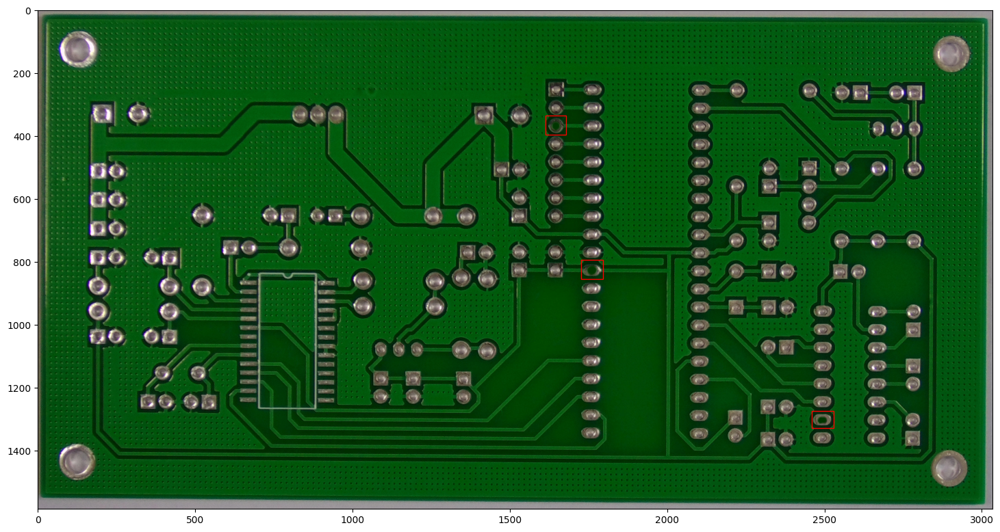

In [ ]:
name = '01_missing_hole_01'
plot_image(name)

08_mouse_bite_01
[1559 1182 1612 1241]
[2143  697 2205  746]
[ 571 1305  628 1354]
[2253  397 2340  462]
[1576 1818 1658 1874]


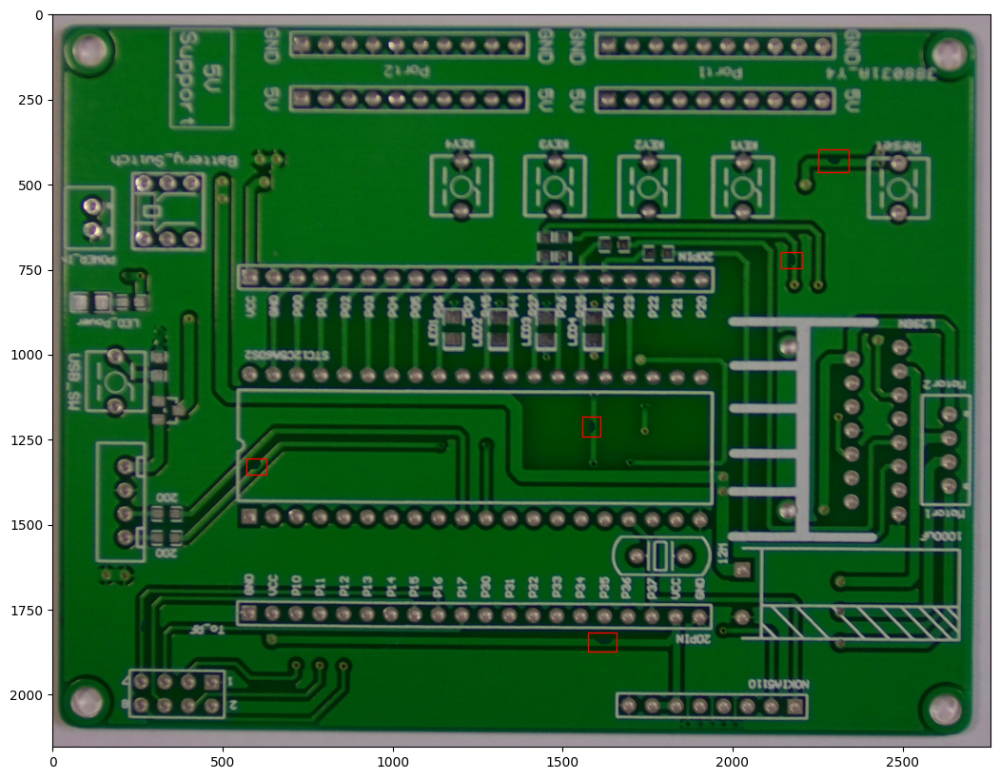

In [ ]:
name = train.file[500]
plot_image(name)

01_missing_hole_11
[1500  736 1559  800]
[2073  685 2146  752]
[482 843 562 916]


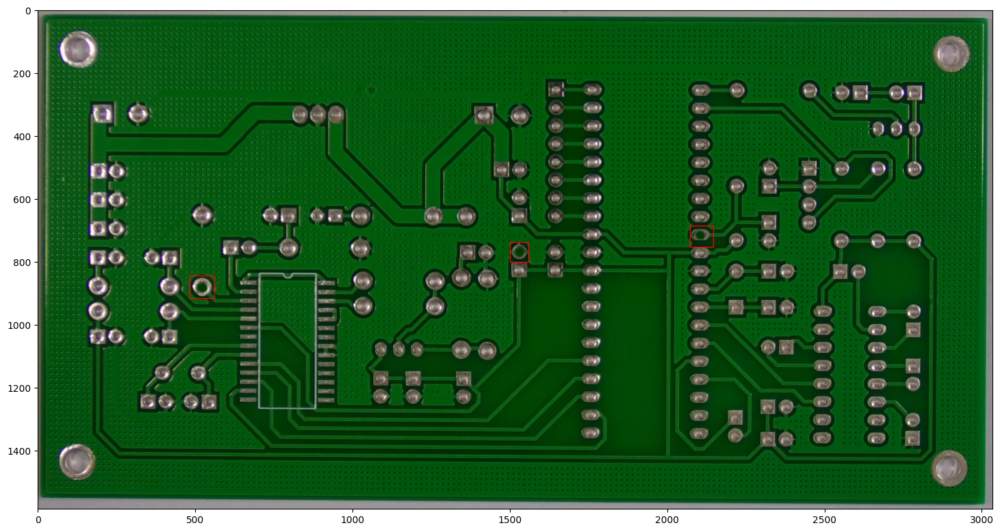

In [ ]:
name = train.file[100]
plot_image(name)

06_spur_06
[ 943 1285  984 1376]
[1237  386 1332  431]
[1018  434 1116  480]
[2043  824 2091  946]
[299 714 394 756]


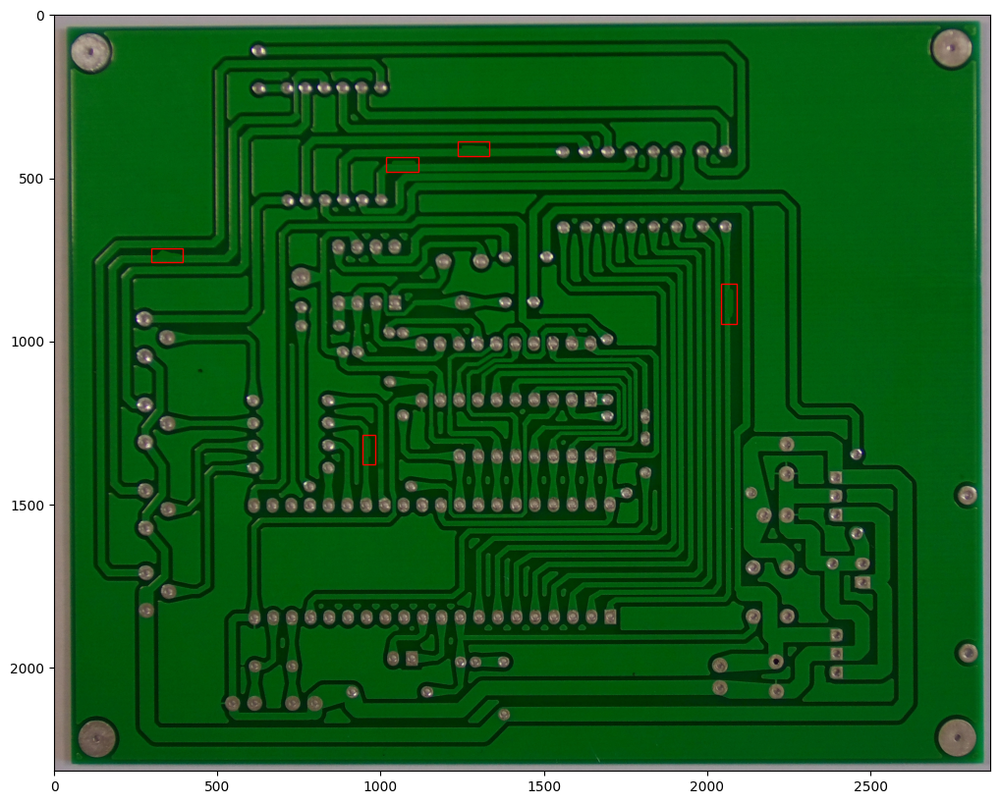

In [ ]:
name = train.file[105]
plot_image(name)

# 3.Creating Custom dataset

use fcbData class which we created in another python file

In [ ]:
def get_train_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

fcb_dataset example

In [ ]:
path ="/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/images/"
fcb_dataset   = fcbData(df, path, get_train_transform())

In [ ]:
type(fcb_dataset[0]), len(fcb_dataset[0]), type(fcb_dataset[0][0]), type(fcb_dataset[0][1]), type(fcb_dataset[0][2])

(tuple, 3, torch.Tensor, dict, str)

In [ ]:
#image tensor(feature), image annotation(target), file name(id)
print([fcb_dataset[0][0], fcb_dataset[0][1], fcb_dataset[0][2]])

[tensor([[[0.6314, 0.6235, 0.6353,  ..., 0.6392, 0.6471, 0.6196],
         [0.6431, 0.6275, 0.6353,  ..., 0.6353, 0.6510, 0.6353],
         [0.6510, 0.6314, 0.6353,  ..., 0.6314, 0.6471, 0.6471],
         ...,
         [0.6118, 0.6118, 0.6314,  ..., 0.6157, 0.6157, 0.6157],
         [0.6118, 0.6078, 0.6235,  ..., 0.6196, 0.6196, 0.6196],
         [0.6235, 0.6039, 0.6039,  ..., 0.6196, 0.6275, 0.6314]],

        [[0.5882, 0.5804, 0.5922,  ..., 0.6000, 0.6078, 0.5804],
         [0.6000, 0.5843, 0.5922,  ..., 0.5961, 0.6118, 0.5961],
         [0.6078, 0.5882, 0.5922,  ..., 0.5922, 0.6078, 0.6078],
         ...,
         [0.5686, 0.5686, 0.5882,  ..., 0.5882, 0.5882, 0.5882],
         [0.5686, 0.5647, 0.5804,  ..., 0.5922, 0.5922, 0.5922],
         [0.5804, 0.5608, 0.5608,  ..., 0.5922, 0.6000, 0.6039]],

        [[0.6118, 0.6039, 0.6157,  ..., 0.6314, 0.6392, 0.6118],
         [0.6235, 0.6078, 0.6157,  ..., 0.6275, 0.6431, 0.6275],
         [0.6314, 0.6118, 0.6157,  ..., 0.6235, 0.6392, 0

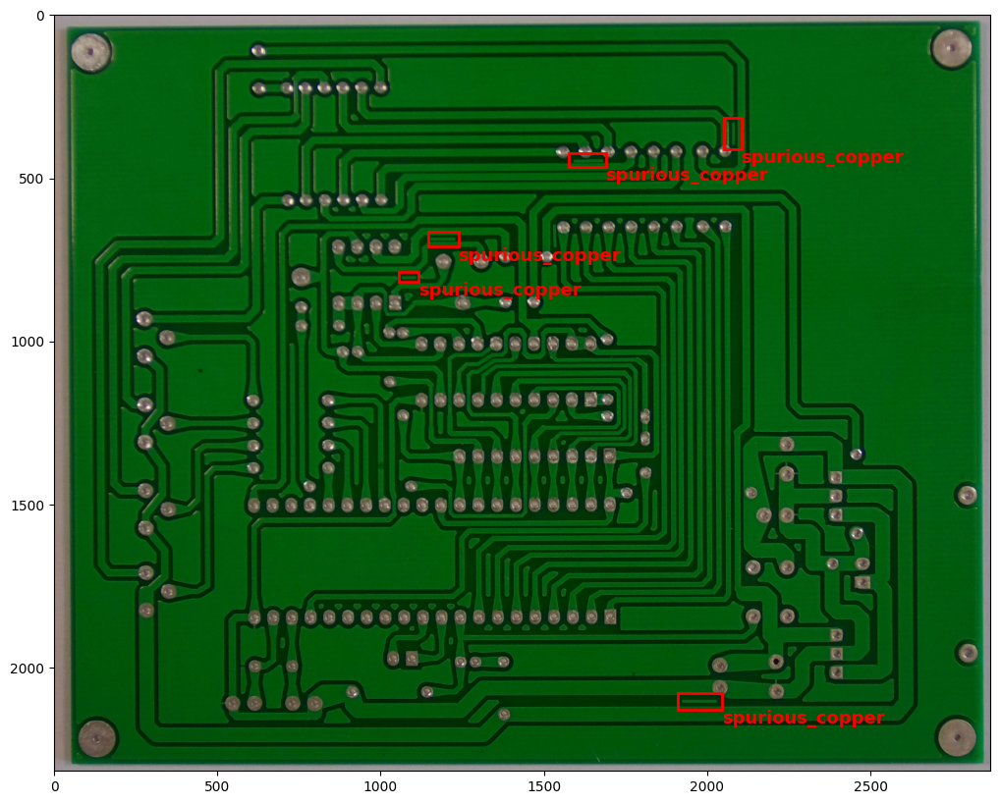

In [ ]:
# show bbox in each image
img, tar, _ = fcb_dataset[0]
bbox = tar['boxes']
fig,ax = plt.subplots(figsize=(18,10))
ax.imshow(img.permute(1,2,0).cpu().numpy())
for j in tar["labels"].tolist():
    classes_la = {6:"missing_hole", 1: "mouse_bite", 2:"open_circuit",3: "short", 4:'spur',5:'spurious_copper'}
    l = classes_la[j]
    for i in range(len(bbox)):
        box = bbox[i]
        x,y,w,h = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = matplotlib.patches.Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none',)
        ax.text(box[2],box[3], l, verticalalignment='top', color='red', fontsize=13, weight='bold')
        ax.add_patch(rect)
    plt.show()

Create dataset for train, val and test

In [ ]:
train_dataset = fcbData(df, path, get_train_transform())
valid_dataset = fcbData(df, path, get_valid_transform())
test_dataset = fcbData(df_2, path, get_train_transform())

# 4.Dataloader

In [ ]:
path

'/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/images/'

In [ ]:
# batch->zip(*batch)->tuple
def collate_fn(batch):
    return tuple(zip(*batch))

In [ ]:
# use DataLoader to define batch size
train_data_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=4,
    collate_fn=utils.collate_fn
)

valid_data_loader = torch.utils.data.DataLoader(
    valid_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=4,
    collate_fn=utils.collate_fn
)


In [ ]:
#get next batch data,should return 1
next(iter(train_data_loader))

((tensor([[[0.6314, 0.6235, 0.6353,  ..., 0.6392, 0.6471, 0.6196],
           [0.6431, 0.6275, 0.6353,  ..., 0.6353, 0.6510, 0.6353],
           [0.6510, 0.6314, 0.6353,  ..., 0.6314, 0.6471, 0.6471],
           ...,
           [0.6118, 0.6118, 0.6314,  ..., 0.6157, 0.6157, 0.6157],
           [0.6118, 0.6078, 0.6235,  ..., 0.6196, 0.6196, 0.6196],
           [0.6235, 0.6039, 0.6039,  ..., 0.6196, 0.6275, 0.6314]],
  
          [[0.5882, 0.5804, 0.5922,  ..., 0.6000, 0.6078, 0.5804],
           [0.6000, 0.5843, 0.5922,  ..., 0.5961, 0.6118, 0.5961],
           [0.6078, 0.5882, 0.5922,  ..., 0.5922, 0.6078, 0.6078],
           ...,
           [0.5686, 0.5686, 0.5882,  ..., 0.5882, 0.5882, 0.5882],
           [0.5686, 0.5647, 0.5804,  ..., 0.5922, 0.5922, 0.5922],
           [0.5804, 0.5608, 0.5608,  ..., 0.5922, 0.6000, 0.6039]],
  
          [[0.6118, 0.6039, 0.6157,  ..., 0.6314, 0.6392, 0.6118],
           [0.6235, 0.6078, 0.6157,  ..., 0.6275, 0.6431, 0.6275],
           [0.6314, 0.

Most pretrained models are trained with a background class, we'll include it in our model, so in that case our number of classes will be 6

In [ ]:
# num_classes = 6 + background =7
num_classes=7

# load a model; pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# get number of input features for the classifier(Box Predictor)
in_features = model.roi_heads.box_predictor.cls_score.in_features

# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [ ]:
# Use GPU
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [ ]:
# Set Optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=0.0001, weight_decay=0.0005,)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

# 5.Training

model(image,(bbox,label))-(confidence score)-NMS-(bbox(gt,preds)-IoU)

In [ ]:
num_epochs = 1

In [ ]:

import sys
best_epoch = 0
min_loss = sys.maxsize
lr1=[]
patience = 30  # patience
counter = 0
best_score = None  # best loss
early_stop = False
best_epoch = None


for epoch in range(num_epochs):
    tk = tqdm(train_data_loader)
    model.train();
    for images, targets, image_ids in tk:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        tk.set_postfix(train_loss=loss_value)
    tk.close()

    # update the learning rate
    if lr_scheduler is not None:
        lr_scheduler.step()

    #store learning rate
    lr_X = optimizer.param_groups[0]['lr']
    lr1.append(lr_X)


    #validation
    model.eval();
    with torch.no_grad():
        tk = tqdm(valid_data_loader)
        for images, targets, image_ids in tk:
            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            val_output = model(images)
            val_output = [{k: v.to(device) for k, v in t.items()} for t in val_output]

            #IOU
            IOU = []
            for j in range(len(val_output)):
                a,b = val_output[j]['boxes'].cpu().detach(), targets[j]['boxes'].cpu().detach()
                chk = torchvision.ops.box_iou(a,b)
                res = np.nanmean(chk.sum(axis=1)/(chk>0).sum(axis=1))
                IOU.append(res)
            tk.set_postfix(IoU=np.mean(IOU))
        tk.close()
    avg_val_loss=loss_value

    print(f"Lr:{lr_X}")
    print(f"Epoch #{epoch} loss: {loss_value}")
    print(f"IOU:{avg_val_loss}")

    #early stopping
    # check if the validation loss improved
    if best_score is None:
        best_score = avg_val_loss
        best_epoch = epoch
        torch.save(model.state_dict(), 'model_best.pt')  # 保存最好的模型参数
    elif avg_val_loss < best_score:
        best_score = avg_val_loss
        best_epoch = epoch
        counter = 0
        torch.save(model.state_dict(), 'model_best.pt')  # 保存最好的模型参数

    else:
        counter += 1
        print(f'EarlyStopping counter: {counter} out of {patience}')
        if counter >= patience:
            early_stop = True

    if early_stop:
        print("Early stopping")
        break


  0%|          | 0/585 [00:00<?, ?it/s]

  0%|          | 0/585 [00:00<?, ?it/s]

Lr:0.0001
Epoch #0 loss: 0.46376508474349976
IOU:0.46376508474349976


Sample evaluation on validation dataset image

In [ ]:
img,target,_ = valid_dataset[0]

# Put the model in evaluation mode
# Turn on evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])[0]

print('predicted boxes: ', len(prediction['boxes']))
print('real boxes: ', len(target['boxes']))

predicted boxes:  12
real boxes:  5


#### Save and Load model

In [ ]:
#pickle save model
pickle.dump(model, open('modeltest1.pkl', 'wb'))

#torch save model
#torch.save(model.state_dict(), 'pcbdetection.pt')

In [ ]:
#load pickle file
picke_model = pickle.load(open('modeltest1.pkl', 'rb'))

#load torch model file
model.load_state_dict(torch.load('model_best.pt'))

<All keys matched successfully>

# 6.Testing

In [ ]:
len(test_dataset)

108

In [ ]:
y_true =[]
y_pred = []

for i in range(len(test_dataset)):
    #return image, target and filename in Groud truth
    img,target,_ = test_dataset[i]

    model.eval()
    with torch.no_grad():
        prediction = model([img.to(device)])[0]

        # Groud truth
        y_true.append(target['labels'][0])

        # Prediction
        y_pred.append(prediction['labels'][0])


In [ ]:
# turn to cpu
yy_pred = []
for v in y_pred:
    yy_pred.append(v.cpu())

In [ ]:
#confusion_matrix
from sklearn.metrics import confusion_matrix
confusion_matrix(y_true, yy_pred)

array([[ 7,  0, 11,  0,  0,  0],
       [ 0, 11,  7,  0,  0,  0],
       [ 0,  0, 18,  0,  0,  0],
       [ 0,  0, 11,  1,  6,  0],
       [ 0,  0, 10,  0,  8,  0],
       [ 0,  0,  0,  0,  0, 18]])

# 7.Evaluation for 1 epoch model

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true, yy_pred))

              precision    recall  f1-score   support

           1       1.00      0.39      0.56        18
           2       1.00      0.61      0.76        18
           3       0.32      1.00      0.48        18
           4       1.00      0.06      0.11        18
           5       0.57      0.44      0.50        18
           6       1.00      1.00      1.00        18

    accuracy                           0.58       108
   macro avg       0.81      0.58      0.57       108
weighted avg       0.81      0.58      0.57       108



# 8.Evaluation for 100 epoch model

In [ ]:
# Define the device for inference (CPU or GPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Load the model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=7)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=7)
model = pickle.load(open('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN/Model, Evaluation and Log/1.7Best_73/modeltest1.pkl', 'rb'))
model.eval()
model.to(device)

y_true =[]
y_pred = []

for i in range(len(test_dataset)):
    #return image, target and filename in Groud truth
    img,target,_ = test_dataset[i]

    model.eval()
    with torch.no_grad():
        prediction = model([img.to(device)])[0]

        # Groud truth
        y_true.append(target['labels'][0])

        # Prediction
        y_pred.append(prediction['labels'][0].cpu())

#confusion_matrix
from sklearn.metrics import confusion_matrix
confusion_matrix(y_true, y_pred)

array([[18,  0,  0,  0,  0,  0],
       [ 0, 18,  0,  0,  0,  0],
       [ 0,  0, 18,  0,  0,  0],
       [ 0,  0,  0, 18,  0,  0],
       [ 0,  0,  4,  0, 14,  0],
       [ 0,  0,  0,  0,  0, 18]])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        18
           2       1.00      1.00      1.00        18
           3       0.82      1.00      0.90        18
           4       1.00      1.00      1.00        18
           5       1.00      0.78      0.88        18
           6       1.00      1.00      1.00        18

    accuracy                           0.96       108
   macro avg       0.97      0.96      0.96       108
weighted avg       0.97      0.96      0.96       108



# 9.Prediction using the 100 epoches model

In [ ]:
# Define the device for inference (CPU or GPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

defect_names = {
1: "Open Circuit",
2: "Short Circuit",
3: "Mouse Bite",
4: "Spur",
5: "Copper Trace Cut",
6: "Missing_hole"
}
# Load the model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=7)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes=7)
model = pickle.load(open('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN/Model, Evaluation and Log/1.7Best_73/modeltest1.pkl', 'rb'))
model.eval()
model.to(device)

# Load the image
image_path = '/content/drive/Shareddrives/ResearchWork/1.PCB_Defects_Datasets/1.0SampleDataSet_6cats/images/Missing_hole/01_missing_hole_01.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = image / 255.0

# Define the transformation to apply to the image
transform = T.Compose([T.ToTensor()])

# Apply the transformation to the image
image = transform(image).to(device)

# Predict the bounding boxes and labels for the image
image = image.float()
outputs = model([image])

# Apply NMS
boxes = outputs[0]['boxes'].detach().cpu()
scores = outputs[0]['scores'].detach().cpu()
labels = outputs[0]['labels'].detach().cpu()

keep = nms(boxes, scores, 1)
boxes = boxes[keep].numpy()
labels = labels[keep].numpy()
scores = scores[keep].numpy()


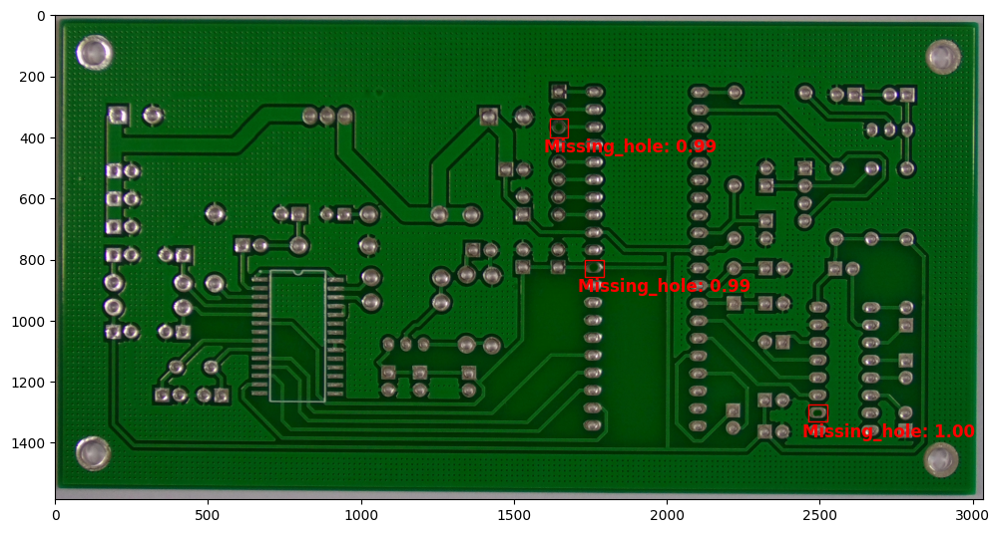

In [ ]:
# Visualize the image and the predicted bounding boxes
fig, ax = plt.subplots(figsize=(12, 8))
ax.imshow(image.permute(1, 2, 0).cpu().numpy())
for box, label, score in zip(boxes, labels, scores):
    x1, y1, x2, y2 = box
    w, h = x2 - x1, y2 - y1
    rect = matplotlib.patches.Rectangle((x1, y1), w, h, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    label_with_score = f"{defect_names[label]}: {score:.2f}"
    ax.text(x1-20, y2 + 50,label_with_score, fontsize=12, color='red', weight='bold')
plt.show()


Transfer the model into cpu.


In [ ]:
import pickle
model = pickle.load(open('/content/drive/Shareddrives/ResearchWork/2.Code/Faster R-CNN/Model, Evaluation and Log/1.7Best_73/modeltest1.pkl', 'rb'))
model =model.to('cpu')

with open('/content/drive/Shareddrives/ResearchWork/model_cpu.pkl', 'wb') as f:
    pickle.dump(model, f)